In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import csv
 
from google.colab import drive 
drive.mount('/content/gdrive')
#df = pd.read_csv('dataset_ocorrencias.csv',sep=';',thousands=',')
 
 
#df = pd.read_csv("gdrive/MyDrive/floripaLSTM/dataset_ocorrencias.csv",sep=';')
df = pd.read_csv("gdrive/MyDrive/UFSC/Doutorado - PPGCC - UFSC/Experimentos/analise2023/dataset_ocorrencias.csv",sep=';')
#df = pd.read_csv("gdrive/MyDrive/dataset_ocorrencias_clusters (1).csv",sep=';')


In [2]:
df.head()

,id_ocorrencia,cidade,populacao,horario,vtr,mtcl,militar_bc,bc_indenizado,obm,coordenada_obm,...,coordenada_ocorrencia,lat_ocorrencia,lon_ocorrencia,tipo,subtipo,tempo_resposta,tempo_total_empenho,firecast,origem_samu,vitima
0,130141257,Tijucas,39889,10/02/2022 13:31:38,ABTR-93,9.317520e+06,Militar,False,3ª/13º BBM - TIJUCAS,130000002|BCU,...,"[-48.6261747,-27.2251231]","-27,2251231","-48,6261747",INCÊNDIO,TERRENO BALDIO,00:30:50,00:45:20,True,NaN,NaN
1,130141257,Tijucas,39889,10/02/2022 13:31:38,ABTR-93,6.420690e+09,BC,True,3ª/13º BBM - TIJUCAS,130000002|BCU,...,"[-48.6261747,-27.2251231]","-27,2251231","-48,6261747",INCÊNDIO,TERRENO BALDIO,00:30:50,00:45:20,True,NaN,NaN
2,130141257,Tijucas,39889,10/02/2022 13:31:38,ABTR-93,4.057899e+08,BC,True,3ª/13º BBM - TIJUCAS,130000002|BCU,...,"[-48.6261747,-27.2251231]","-27,2251231","-48,6261747",INCÊNDIO,TERRENO BALDIO,00:30:50,00:45:20,True,NaN,NaN
3,130138756,São João Batista,39719,24/01/2022 21:41:29,ABTR80,6.914667e+06,Militar,False,1º/3º/3ª/13º BBM - SÃO JOÃO BATISTA,130000005|BCU,...,"[-48.8719916,-27.2617414]","-27,2617414","-48,8719916",INCÊNDIO,TERRENO BALDIO,00:05:10,00:07:02,True,NaN,NaN
4,10169265,Governador Celso Ramos,14739,08/10/2022 14:50:54,ASU-391,9.335803e+06,Militar,False,1º/2ª/3ª/10ºBBM - GOV.CELSO RAMOS,10000001|FLN,...,"[-48.5333943,-27.3798632]","-27,3798632","-48,5333943",ATENDIMENTO PRÉ-HOSPITALAR,QUEDA,NaN,00:00:06,True,NaN,FLN2022|8090


# **Dicionário**

id_ocorrencia - identificação única da ocorrência

cidade - A cidade onde aconteceu a ocorrência

população - Pupulação da cidade

horario - horario da ocorrencia com data e hora

vtr - viatura empenhanha na ocorrencia

mtcl - matricula do militar ou cpf do Bombeiro comunitario

militar_bc - identificação se o individuo é Bombeiro Comunitário ou Bombeiro 
Militar

bc_indenizado - Identifica se o Bombeiro Comunitario estava no serviço sendo 
pago(indenizado) ou não

obm - Organização Bombeiro Militar que estava na ocorrência

coordenada_obm - Coordenada da organização Bombeiro Militar

coordenada_ocorrencia - Coordenada da Ocorrência

lat_ocorrencia - Latitude ocorrência

lon_ocorrencia - Longitude Ocorrência

tipo - Tipo da ocorrência, pode ser Atendimento pré-hospitalar - APH, incendio, acidente e outros.

subtipo - especifica o tipo, num APH, pode especificar desmaio, nem sempre é preenchido.

tempo_resposta - Tempo do acionamento até a chegada ao local da ocorrêcia, pode ser um dado que estaja bem falho, pois acontece do bombeiro esquecer de clicar no botão

tempo_total_empenho - tempo total da saída da obm até a chegada a obm novamente.
firecast - indica se uma viatura utilizou o sistema "firecast" para dar J-9, J-10, J-11 e J-12 nos deslocamentos

origem_samu - Se foi um repasse da ocorrência que era do samu

vitima - geração no sistema, talvez de pra gerar o número de vítimas, nome, idade, alguns sinais vitais.

# **Clustering and cleaning**

In [6]:
df.dropna(axis=0,how='any',subset=['lat_ocorrencia','lon_ocorrencia'],inplace=True)

# Variable with the Longitude and Latitude
X=df.loc[:,['id_ocorrencia','cidade','horario','lat_ocorrencia','lon_ocorrencia','tipo']]
X =  X.loc[X['cidade'] == 'Florianópolis']
X =  X.loc[X['tipo'] == 'ATENDIMENTO PRÉ-HOSPITALAR']
X = X.loc[X["lon_ocorrencia"] >= -48,6,:]

X = X.drop_duplicates(subset ="id_ocorrencia",keep='first')
X["Date"] = pd.to_datetime(X["horario"],infer_datetime_format = True).dt.floor('1D')
X =  X.loc[X['Date'] >= '2019-07-01']
X




TypeError: ignored

In [ ]:
X.describe()

,id_ocorrencia,lat_ocorrencia,lon_ocorrencia
count,1.000200e+04,10002.000000,10002.000000
mean,1.008706e+07,-27.573574,-48.516311
std,1.353593e+04,0.064403,0.055897
min,1.006421e+07,-27.884433,-48.599992
25%,1.007564e+07,-27.600147,-48.554228
50%,1.008583e+07,-27.590657,-48.527459
75%,1.009794e+07,-27.574871,-48.479205
max,1.011282e+07,-27.314790,-48.372780


In [ ]:
kmeans = KMeans(n_clusters = 4, init ='k-means++', random_state = 12)
kmeans.fit(X[X.columns[3:5]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[3:5]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[3:5]]) # Labels of each point


Data = pd.DataFrame()
#print(Data)


#criar coluna X_dia

X['cluster_label'] = X['cluster_label'].astype('category')
v = X.groupby(['Date', 'cluster_label']).size().unstack(fill_value=0)
#binary_z = (z > 0).astype(int) #changing to binary dataset
#v = binary_z

print(v.info)

<bound method DataFrame.info of cluster_label  0  1  2  3
Date                     
2017-01-01     9  6  2  8
2017-01-02     3  4  1  4
2017-01-03     6  3  1  4
2017-01-04     8  4  1  3
2017-01-05     7  4  0  6
...           .. .. .. ..
2019-06-27     9  3  1  0
2019-06-28     3  3  1  1
2019-06-29     1  3  0  1
2019-06-30     2  2  0  1
2019-07-01     3  1  0  0

[912 rows x 4 columns]>


In [ ]:
v.describe()

cluster_label,0,1,2,3
count,912.000000,912.000000,912.000000,912.000000
mean,6.243421,2.030702,0.824561,1.868421
std,3.114704,1.621460,0.952165,1.726087
min,0.000000,0.000000,0.000000,0.000000
25%,4.000000,1.000000,0.000000,0.750000
50%,6.000000,2.000000,1.000000,1.000000
75%,8.000000,3.000000,1.000000,3.000000
max,27.000000,9.000000,6.000000,12.000000


In [ ]:
v.sum(axis=0)

cluster_label
0    5694
1    1852
2     752
3    1704
dtype: int64

## Data Plot understanding -correlação

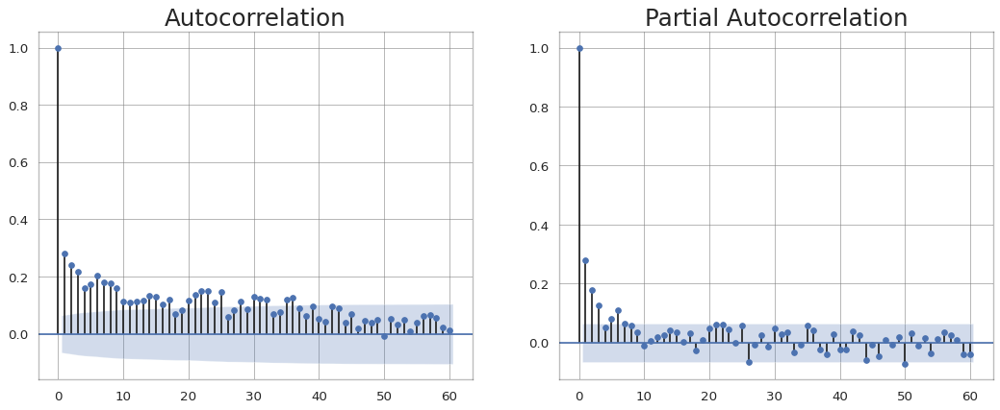

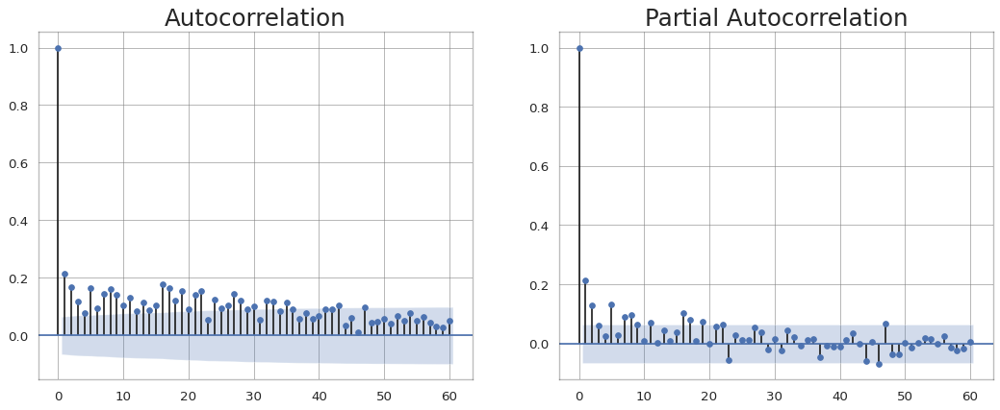

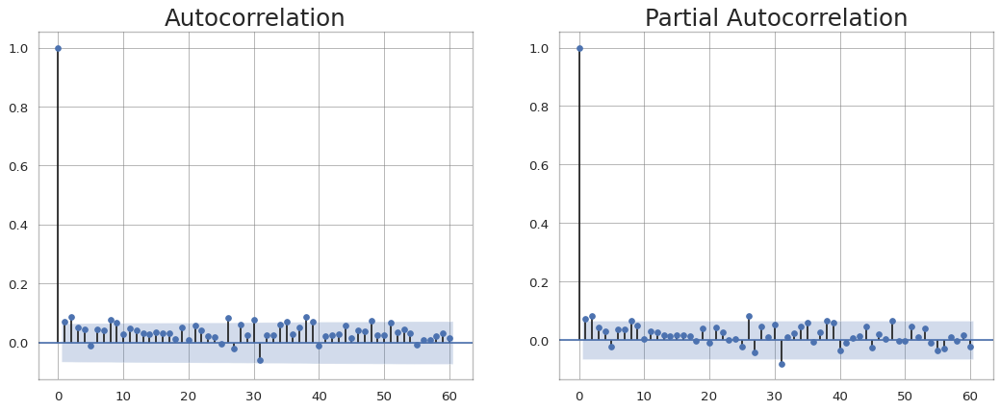

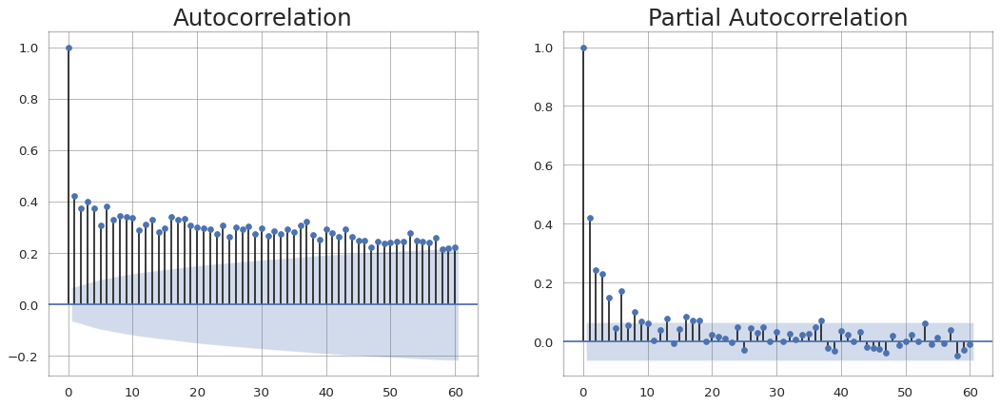

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
sns.set_style(style='white')

# Import Data

# Draw Plot
for i in range(0,v.columns.size):
  fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
  plot_acf(v[i] .tolist(), ax=ax1, lags=60)
  plot_pacf(v[i] .tolist(), ax=ax2, lags=60)

  # https://towardsdatascience.com/time-series-from-scratch-autocorrelation-and-partial-autocorrelation-explained-1dd641e3076f
  # lighten the borders
  ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
  ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
  ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
  ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)
  ax1.set_title('Autocorrelation', fontdict={'fontsize': 22})
  ax2.set_title('Partial Autocorrelation', fontdict={'fontsize': 22})


  ax1.grid(which="major", color="grey", linestyle="-", linewidth=0.5)
  ax2.grid(which="major", color="grey", linestyle="-", linewidth=0.5)

  # font size of tick labels
  ax1.tick_params(axis='both', labelsize=12)
  ax2.tick_params(axis='both', labelsize=12)
  plt.show()


The analysis of PACF and PACF by formed cluster evaluated each of the groups individually regarding their respective occurrence characteristics. Analyzing individually can demonstrate which cluster dominates analysis or in which we have a low correlation.


For example, we have that cluster 1 (has the highest occurrence numbers) has high correlation for many days values ​​(Figure XX). In the figure of PACF we can see that until the 6th we have a value close to 0.2 of correlation, after that the values ​​fall.

Another important observation that we can make is that for cluster 0 (Figure XX) we have a low correlation, the lowest among all the analyses. This low correlation can jeopardize the analysis and indicate a low relationship between the occurrences in that region. Still, this cluster is the one with the lowest number of occurrences within the analyses.

# Plot de dias

In [ ]:
!pip install calmap

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


<Figure size 0x0 with 0 Axes>

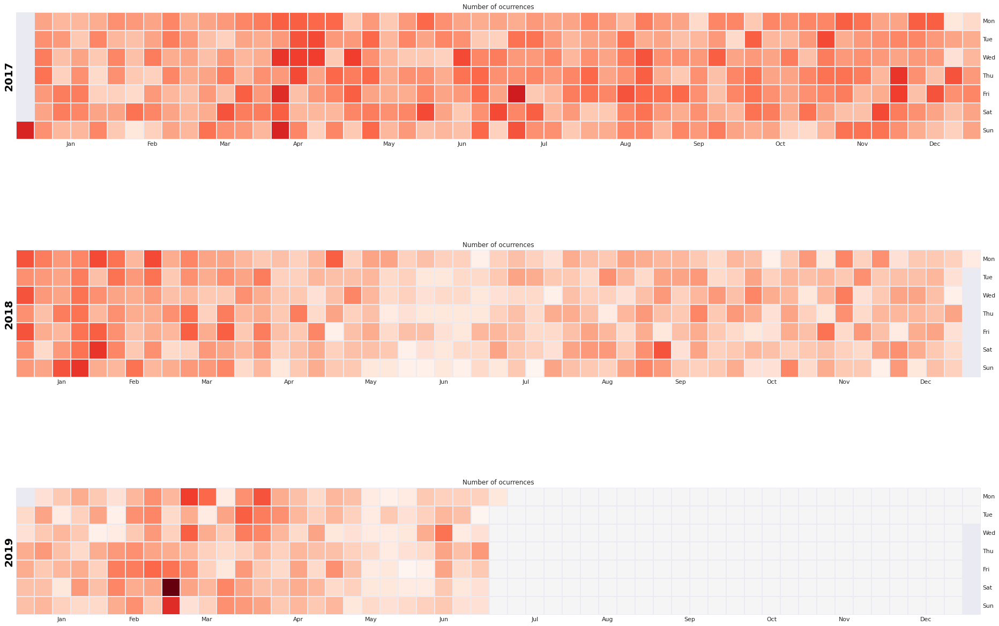

In [ ]:
import matplotlib as mpl
import calmap
#!pip install calmap

# Import Data


# Plot
plt.figure(figsize=(26,20), dpi=0)
calmap.calendarplot(v.sum(axis=1) , fig_kws={'figsize': (26,20)}, yearlabel_kws={'color':'black', 'fontsize':20}, subplot_kws={'title':'Number of ocurrences'})
plt.show()

# **TEstes Com Feriados**

In [ ]:
import holidays

feriados= holidays.Brazil()
feriados

for feriado in feriados['2019-01-01': '2021-03-31'] :
    print(feriado)

feriado

2019-01-01
2019-03-05
2019-03-06
2019-04-19
2019-04-21
2019-05-01
2019-06-20
2019-09-07
2019-10-12
2019-11-02
2019-11-15
2019-12-25
2021-01-01
2021-02-16
2021-02-17


datetime.date(2021, 2, 17)

# *Análise de decomposição*

In [ ]:
DadoInteiro = v.sum(axis=1) 
dados30=DadoInteiro.loc[DadoInteiro.index<='2017-03-30']
dados6m=DadoInteiro.loc[DadoInteiro.index<='2017-06-30']
dados1ano=DadoInteiro.loc[DadoInteiro.index<='2019-01-1']

In [ ]:
import seaborn as sns
sns.set_style("whitegrid")
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

#extracting dayli seasonality from time series adjusted by daily seasonality
sd_3m = sm.tsa.seasonal_decompose(dados30, freq=7)

#extracting weekly seasonality from time series adjusted by daily seasonality
sd_6m = sm.tsa.seasonal_decompose(dados6m, freq=7)



#extracting yearly seasonality from time series adjusted by daily and weekly seasonality
sd_2a = sm.tsa.seasonal_decompose(dados1ano, freq=30)

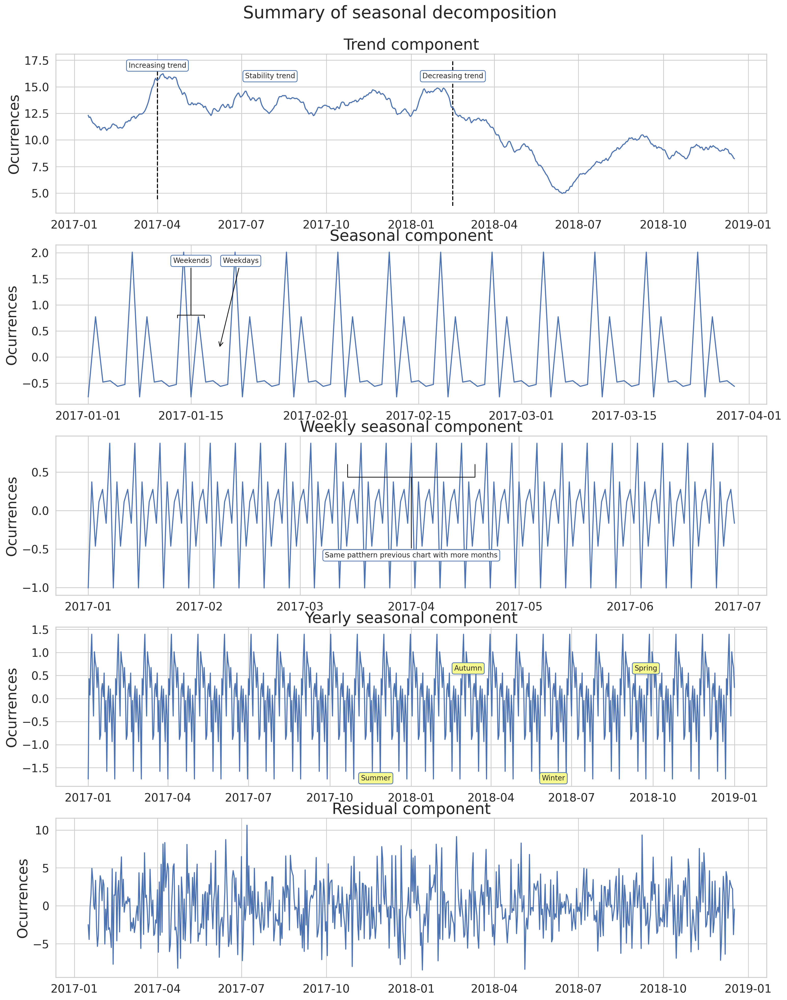

In [ ]:
import datetime

#drawing figure with subplots, predefined size and resolution
f, axes = plt.subplots(5,1,figsize=(18,24),dpi=200);


#setting figure title and adjusting title position and size
plt.suptitle('Summary of seasonal decomposition', y=0.92, fontsize=24);

#plotting trend component
axes[0].plot(sd_2a.trend)
axes[0].set_title('Trend component', fontdict={'fontsize': 22});

#drawing black dashed vertical lines between y axis limits
axes[0].vlines(datetime.datetime(2017,4,1), axes[0].get_ylim()[0], axes[0].get_ylim()[1], colors='black', linestyles='dashed');
axes[0].vlines(datetime.datetime(2018,2,15), axes[0].get_ylim()[0], axes[0].get_ylim()[1], colors='black', linestyles='dashed');

#placing three comments in text boxes
axes[0].text(datetime.datetime(2017,4,1), 17, 'Increasing trend',
             ha='center', va='center', bbox=dict(fc='white', ec='b', boxstyle='round'));
axes[0].text(datetime.datetime(2017,8,1), 16, 'Stability trend',
             ha='center', va='center', bbox=dict(fc='white', ec='b', boxstyle='round'));
axes[0].text(datetime.datetime(2018,2,15), 16, 'Decreasing trend',
             ha='center', va='center', bbox=dict(fc='white', ec='b', boxstyle='round'));

#plotting daily seasonal component
axes[1].plot(sd_3m.seasonal);
axes[1].set_title('Seasonal component', fontdict={'fontsize': 22});
axes[1].annotate('Weekdays', xy=(0.23, 0.35),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.26, 0.9),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='->',
                            mutation_scale=15,
                            connectionstyle='arc3'));
axes[1].annotate('Weekends', xy=(0.19, 0.55),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.19, 0.90),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='-[',
                            mutation_scale=19,
                            connectionstyle='arc3'));

                            
          

#plotting weekly seasonal component
axes[2].plot(sd_6m.seasonal);
axes[2].set_title('Weekly seasonal component', fontdict={'fontsize': 22});

#placing comment in annotation with text box and arrow
axes[2].annotate('Same patthern previous chart with more months', xy=(0.50, 0.75),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.50, 0.25),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='w', ec='b'),
            arrowprops=dict(color='black',
                            arrowstyle='-[',
                            mutation_scale=90,
                            connectionstyle='arc3'));

#plotting yearly seasonality
axes[3].plot(sd_2a.seasonal);
axes[3].set_title('Yearly seasonal component', fontdict={'fontsize': 22});

#placing comments in annotations with text boxes and arrows
axes[3].annotate('Summer', xy=(0.34, 0.30),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.45, 0.05),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='#f5f88f', ec='b'));
axes[3].annotate('Autumn', xy=(0.54, 0.50),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.58, 0.74),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='#f5f88f', ec='b'));
axes[3].annotate('Winter', xy=(0.54, 0.50),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.70, 0.05),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='#f5f88f', ec='b'));
axes[3].annotate('Spring', xy=(0.54, 0.50),
            xycoords='axes fraction',
            va='center', ha='center',
            xytext=(0.83, 0.74),
            textcoords='axes fraction',
            bbox=dict(boxstyle='round', fc='#f5f88f', ec='b'));

#plotting residual of decomposition
axes[4].plot(sd_2a.resid);
axes[4].set_title('Residual component', fontdict={'fontsize': 22});

#setting label for each y axis
for a in axes:
    a.set_ylabel('Ocurrences', fontdict={'fontsize': 20});
    a.axes.tick_params(labelsize = 16)
    
plt.show();


    



/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


NameError: ignored

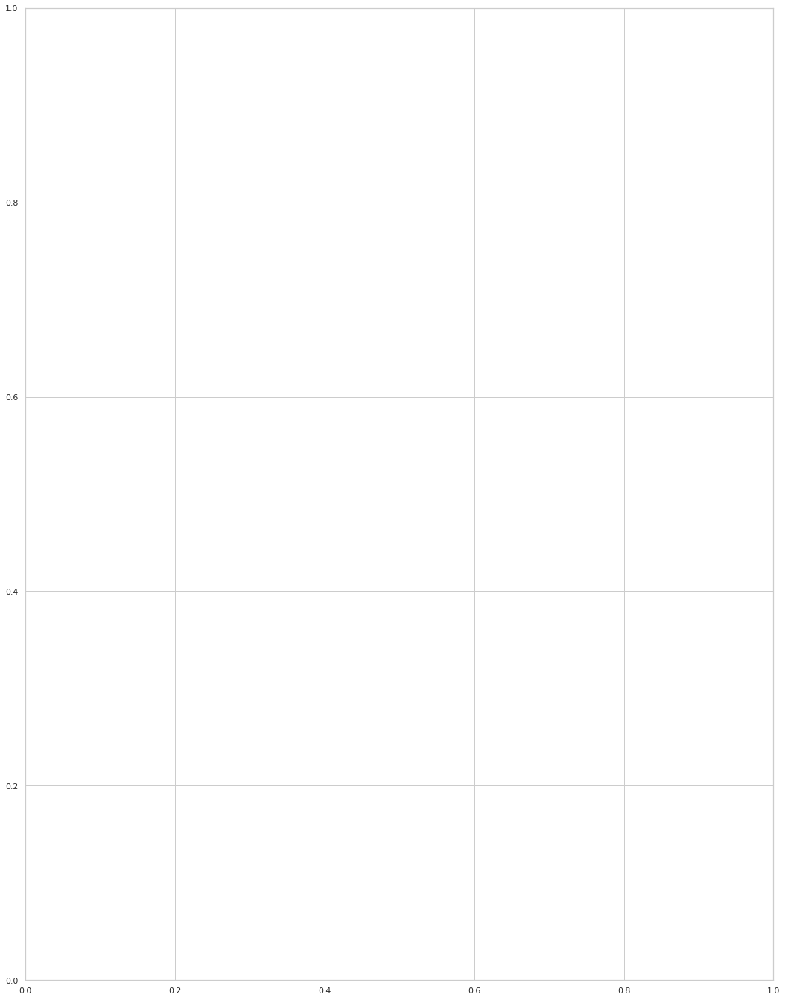

In [ ]:
import torch
import torch.nn as nn
from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
sns.set_style("whitegrid")
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

decomp = plt.subplots(figsize=(18, 24))


print(dados201801)
data = pd.DataFrame(dados201801)
data = data.add_prefix('cluster_').reset_index()
print(data)

data.set_index(pd.DatetimeIndex(data["Date"] ), inplace=True)

#print(data)

#result=seasonal_decompose(data['cluster_0'], model='additive', freq=365)

from pylab import rcParams
for column in range(1,data.columns.size):
  rcParams['figure.figsize'] = 20, 15
  rcParams['axes.labelsize'] = 20
  rcParams['ytick.labelsize'] = 16
  rcParams['xtick.labelsize'] = 16
  #rcParams['axes.facecolor'] = 'white'
 # rcParams['grid.color'] = 'white'
  decomposition = sm.tsa.seasonal_decompose(data[data.columns[column]], model='additive',freq=7)
  decomp = decomposition.plot()
  decomp.suptitle('Cluster decomposition', fontsize=22)
print(data)




As you may see (more clearly in the left panel), trend and data are on the same scale. When we subtract the trend from the data, seasonal component and remainder is left. Both the seasonal component and the remainder are centered (in both panels) and show what would have to be subtracted or added respectively from the trend component to get back the actual time series data.

consider the seasonality as fluctuations from the trend; actual value above the trend: seasonality positive, actual value equals trend: seasonality zero, actual value below trend: seasonality negative (remainder neglected)


 *The recipe followed is*

observed = trend + seasonal + random

where the last two are centred at zero. Commonly, trend is long-term change, seasonal is systematic departure given time of year and random is whatever is unpredicted otherwise.

# **Treino com uma variavel**

(912, 1)
[752]


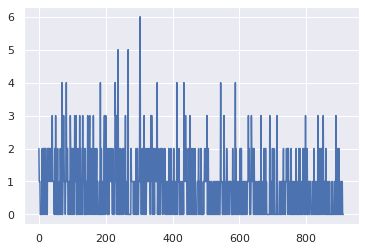

In [ ]:
import torch
import torch.nn as nn
from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns

training_set = v

training_set = training_set.iloc[:,2:3].values

print(training_set.shape)
print(training_set.sum(axis=0))


plt.plot(training_set, label = 'uma oco')
plt.show()



### **Treino com mais variaveis**

(912, 4)


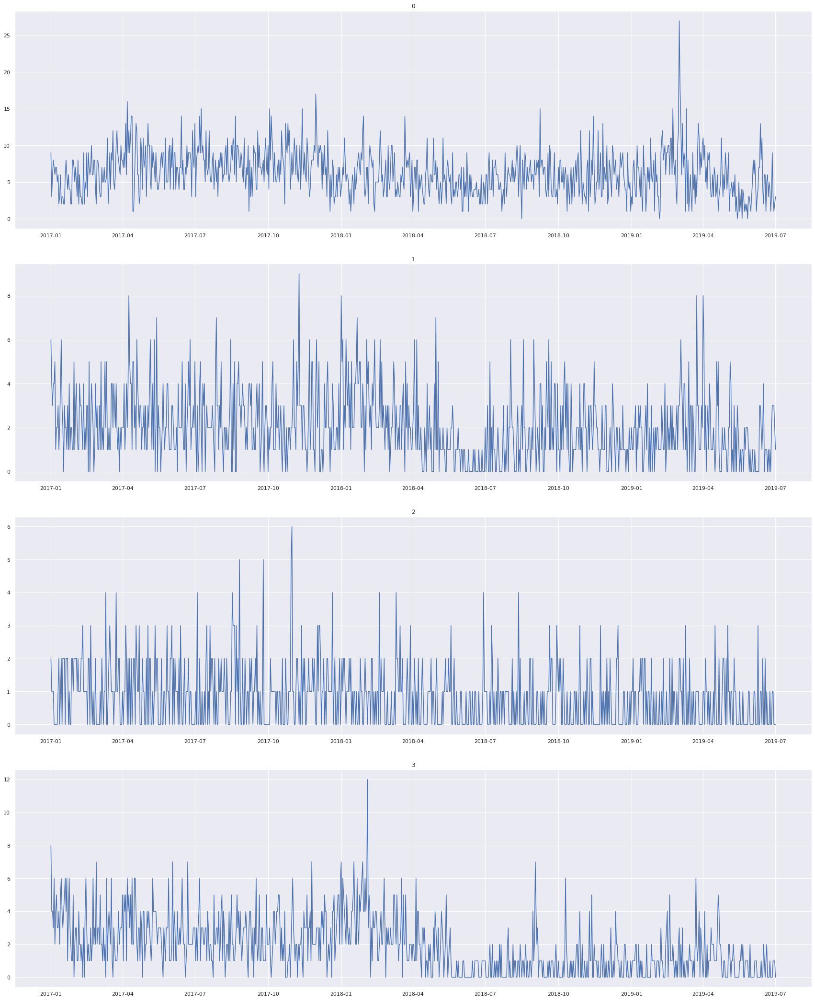

In [ ]:
import torch
import torch.nn as nn
from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns

training_set = v

training_set = training_set.iloc[:,:].values

print(training_set.shape)

#plt.plot(training_set, label = 'Shampoo Sales Data')
#plt.plot(training_set)
#plt.show()


fig, axs = plt.subplots(4,1, figsize=(25,30))
fig.tight_layout(pad = 5)
for i in range(0,v.columns.size):
    axs[(i)].plot(v[v.columns[i]])
    axs[(i)].set_title(v.columns[i])

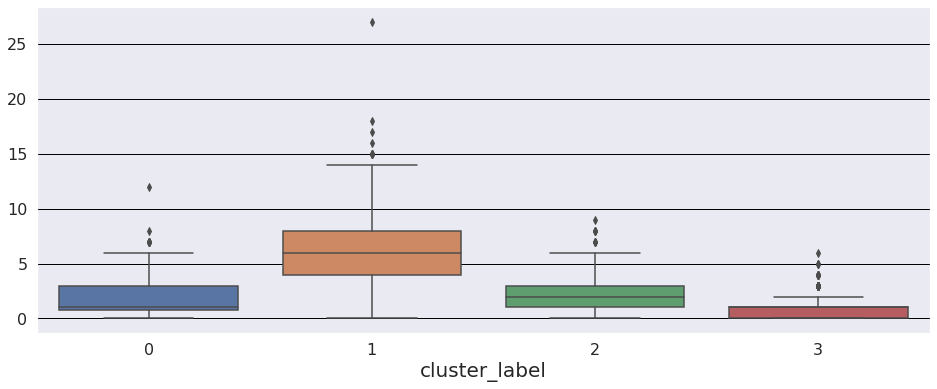

In [ ]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(data=v)
#ax = sns.swarmplot(data=v, color=".25")

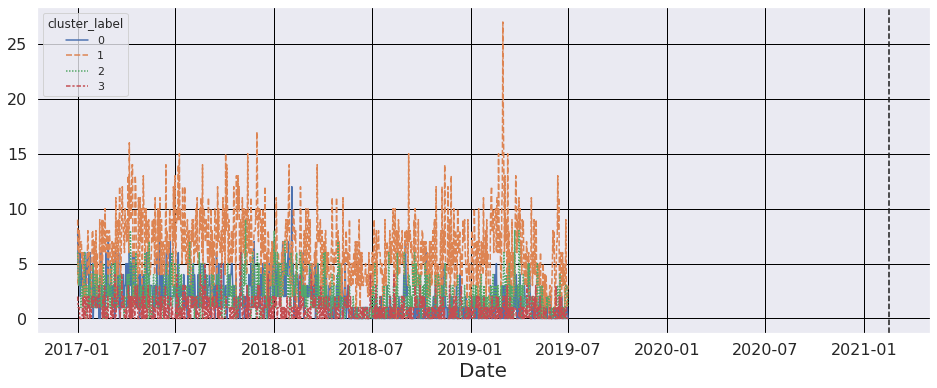

In [ ]:


# simple time series plot
plt.figure(figsize=(16, 6))

pl = sns.lineplot(data = v)
pl.axvline(feriado, color="k", linestyle="--")


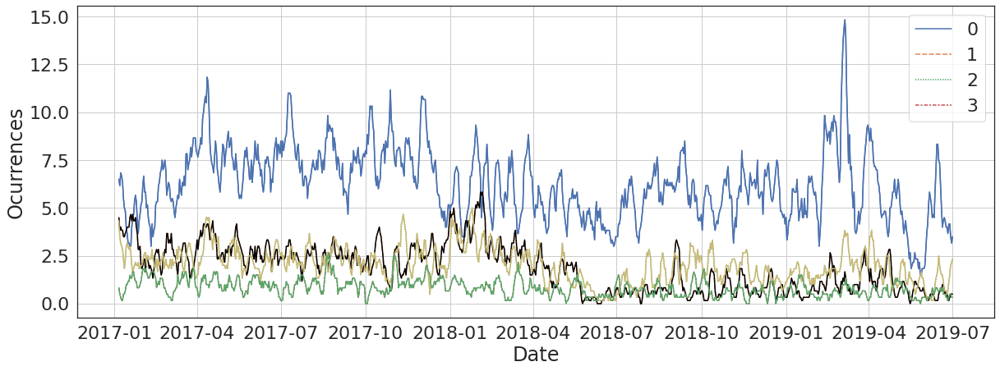

In [ ]:
plt.figure(figsize=(20, 7))
ma = v.rolling(window=6).mean() 
g = sns.lineplot(data = ma)
g.legend(labels=['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'])
g.set_ylabel("Ocurrences")
sns.set(font_scale=2)
sns.color_palette("Spectral", as_cmap=True)
sns.set_style("white",{'axes.grid' : True})
sns.lineplot(data=ma[0], color='b')
sns.lineplot(data=ma[1], color='black')
sns.lineplot(data=ma[2], color='y')
sns.lineplot(data=ma[3], color='g')
#g.axvline(feriado, color="k", linestyle="--")



# Data is Stationary?

In [ ]:
from statsmodels.tsa.stattools import adfuller
for i in range(0,v.columns.size):
	result = adfuller(v[v.columns[i]])


	#anotar
	print('ADF Statistic: %f' % result[0])
	print('p-value: %f' % result[1])
	for key, value in result[4].items():
	  print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.837337
p-value: 0.053135
	1%: -3.438
	5%: -2.865
	10%: -2.568
ADF Statistic: -6.385457
p-value: 0.000000
	1%: -3.438
	5%: -2.865
	10%: -2.568
ADF Statistic: -3.017099
p-value: 0.033328
	1%: -3.438
	5%: -2.865
	10%: -2.569
ADF Statistic: -18.879532
p-value: 0.000000
	1%: -3.438
	5%: -2.865
	10%: -2.568


## Dataloading

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
#training_set = v[0]
#training_set

Date
2017-01-01    8
2017-01-02    4
2017-01-03    4
2017-01-04    3
2017-01-05    6
             ..
2021-01-15    1
2021-01-16    5
2021-01-17    5
2021-01-18    3
2021-01-19    0
Name: 0, Length: 1283, dtype: int64

# janela deslizante fixa

In [ ]:
def sliding_windows(data, seq_length):
    x = []
    y = []

    for i in range(len(data)-seq_length-1):
        _x = data[i:(i+seq_length)]
        _y = data[i+seq_length]
        x.append(_x)
        y.append(_y)

    return np.array(x),np.array(y)

sc = MinMaxScaler()
training_data = sc.fit_transform(training_set)

seq_length = 6
x, y = sliding_windows(training_data, seq_length)

train_size = int(len(y) * 0.70)#treino e teste -> olhar talvez  70,
val_size = int(len(y) *0.90) #intervalo entre no codigo 70 e 90
test_size = int(len(y)*0.10) #restante, pelo codigo esse valor não é utilizado
#test_size = len(y) - train_size

#valição 

dataX = Variable(torch.Tensor(np.array(x)))
#print(dataX.shape)
dataY = Variable(torch.Tensor(np.array(y)))

trainX = Variable(torch.Tensor(np.array(x[0:train_size])))
trainY = Variable(torch.Tensor(np.array(y[0:train_size])))

valX = Variable(torch.Tensor(np.array(x[train_size:val_size])))
valY = Variable(torch.Tensor(np.array(y[train_size:val_size])))

testX = Variable(torch.Tensor(np.array(x[val_size:len(x)])))
testY = Variable(torch.Tensor(np.array(y[val_size:len(y)])))
print(testY.shape)

torch.Size([91, 1])


# janela deslizante que varia o tempo no **futuro**

In [ ]:
def sliding_windows(data, seq_length):
    x = []
    y = []
    n_future = 1

    for i in range(len(data)): #-seq_length-1
        past_end = i + seq_length
        future_end = past_end + n_future
        if future_end > len(data):
          break
        _x = data[i:past_end]
        _y = data[past_end:future_end]
        #past, future = series[window_start:past_end, :], series[past_end:future_end, :]
        x.append(_x)
        y.append(_y)
       
    return np.array(x),np.array(y)



#print(training_data.shape)
sc = MinMaxScaler()
training_data = sc.fit_transform(training_set)

seq_length = 7
x, y = sliding_windows(training_data, seq_length)

train_size = int(len(y) * 0.70)#treino e teste -> olhar talvez  70,
val_size = int(len(y) *0.90) #intervalo entre no codigo 70 e 90
test_size = int(len(y)*0.10) #restante, pelo codigo esse valor não é utilizado
#test_size = len(y) - train_size

#valição 

dataX = Variable(torch.Tensor(np.array(x)))
#print(dataX.shape)
dataY = Variable(torch.Tensor(np.array(y)))

trainX = Variable(torch.Tensor(np.array(x[0:train_size])))
trainY = Variable(torch.Tensor(np.array(y[0:train_size])))

valX = Variable(torch.Tensor(np.array(x[train_size:val_size])))
valY = Variable(torch.Tensor(np.array(y[train_size:val_size])))

testX = Variable(torch.Tensor(np.array(x[val_size:len(x)])))
testY = Variable(torch.Tensor(np.array(y[val_size:len(y)])))

print(testY.shape)
#print(testX.shape)
#treino e teste com 7 dias a frente
#https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html

#t = testX.numpy()
#print(t.shape)

torch.Size([91, 1, 1])


In [ ]:
def split_series(series, n_past, n_future):
  #
  # n_past ==> no of past observations
  #
  # n_future ==> no of future observations 
  #
  X, y = list(), list()
  for window_start in range(len(series)):
    past_end = window_start + n_past
    future_end = past_end + n_future
    if future_end > len(series):
      break
    # slicing the past and future parts of the window
    past, future = series[window_start:past_end, :], series[past_end:future_end, :]
    X.append(past)
    y.append(future)
  return np.array(X), np.array(y)

# **Model**

In [ ]:

class LSTM(nn.Module):

    def __init__(self, num_classes, input_size, hidden_size, num_layers):
        super(LSTM, self).__init__()
        
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length
        
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,num_layers=num_layers, batch_first=True) #lstm
        self.fc_1 =  nn.Linear(hidden_size, 128) #fully connected 1
        self.fc = nn.Linear(128, num_classes) #fully connected last layer

        self.relu = nn.ReLU()

    def forward(self, x):
        h_0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        c_0 = Variable(torch.zeros(self.num_layers, x.size(0), self.hidden_size))
        
        output, (hn, cn) = self.lstm(x, (h_0, c_0)) #lstm with input, hidden, and internal state
        hn = hn.view(-1, self.hidden_size) #reshaping the data for Dense layer next
        out = self.relu(hn)
        out = self.fc_1(out) #first Dense
        out = self.relu(out) #relu
        out = self.fc(out) #Final Output
        return out

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

### **Training**

In [ ]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('runs/working_directory2')
%load_ext tensorboard


num_epochs = 500
learning_rate = 0.01

input_size = 1
hidden_size = 2
num_layers = 1

num_classes = 1

lstm = LSTM(num_classes, input_size, hidden_size, num_layers)

criterion = torch.nn.L1Loss()    # mean-squared error for regression
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

writer.add_graph(lstm, trainX)
writer.close()
#optimizer = torch.optim.SGD(lstm.parameters(), lr=learning_rate)

# Train the model
iter_no=0
for epoch in range(num_epochs):
    running_loss = []
    outputs = lstm(trainX)
    #print(trainX.shape)
    #print(outputs.shape)
    #print(trainY.shape)
    #limpa os grandientes
    optimizer.zero_grad()
    #writer.add_histogram('distribution centers', trainX)
    # obtain the loss function
    loss = criterion(outputs, trainY)
    #writer.add_scalar("Loss/train", loss, epoch)
    #writer.add_scalar("Loss/iter", loss, iter_no)
    loss.backward()
    
    optimizer.step()
    #loss_val = criterion(outputs, trainY)
    iter_no += 1

    #validation
    outputs_val = lstm(valX)
    loss_val = criterion(outputs_val, valY)
    #writer.add_scalar("LossVal/train", loss_val, epoch)
    writer.add_scalars('Loss', {'LossVal':loss_val,'LossTrain':loss}, epoch) #adicionar mais de um escalar num grafico do tensorboard

    if epoch % 100 == 0:
      print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))
      print("Epoch: %d, val_loss: %1.5f" % (epoch, loss_val.item()))
#plt.plot(epoch,running_loss)  
#writer.flush()
writer.close()
print(loss)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Epoch: 0, loss: 0.18952
Epoch: 0, val_loss: 0.20779
Epoch: 100, loss: 0.13191
Epoch: 100, val_loss: 0.12120
Epoch: 200, loss: 0.12546
Epoch: 200, val_loss: 0.12281
Epoch: 300, loss: 0.12343
Epoch: 300, val_loss: 0.12284
Epoch: 400, loss: 0.12487
Epoch: 400, val_loss: 0.12807
tensor(0.1245, grad_fn=<L1LossBackward0>)


In [ ]:
tensorboard  --logdir=runs

Reusing TensorBoard on port 6006 (pid 566), started 0:01:10 ago. (Use '!kill 566' to kill it.)

<IPython.core.display.Javascript object>

## Testing for Emergency Events Dataset

In [ ]:
data_predict = train_predict.data.numpy()
print(data_predict.shape)
dataY_plot = testY.data.numpy()
print(dataY_plot.shape)

(91, 1)
(91, 1, 1)


IndexError: ignored

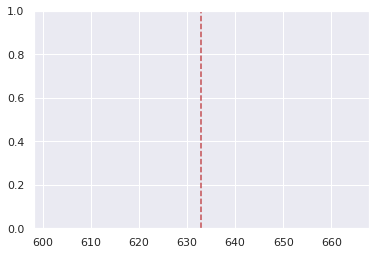

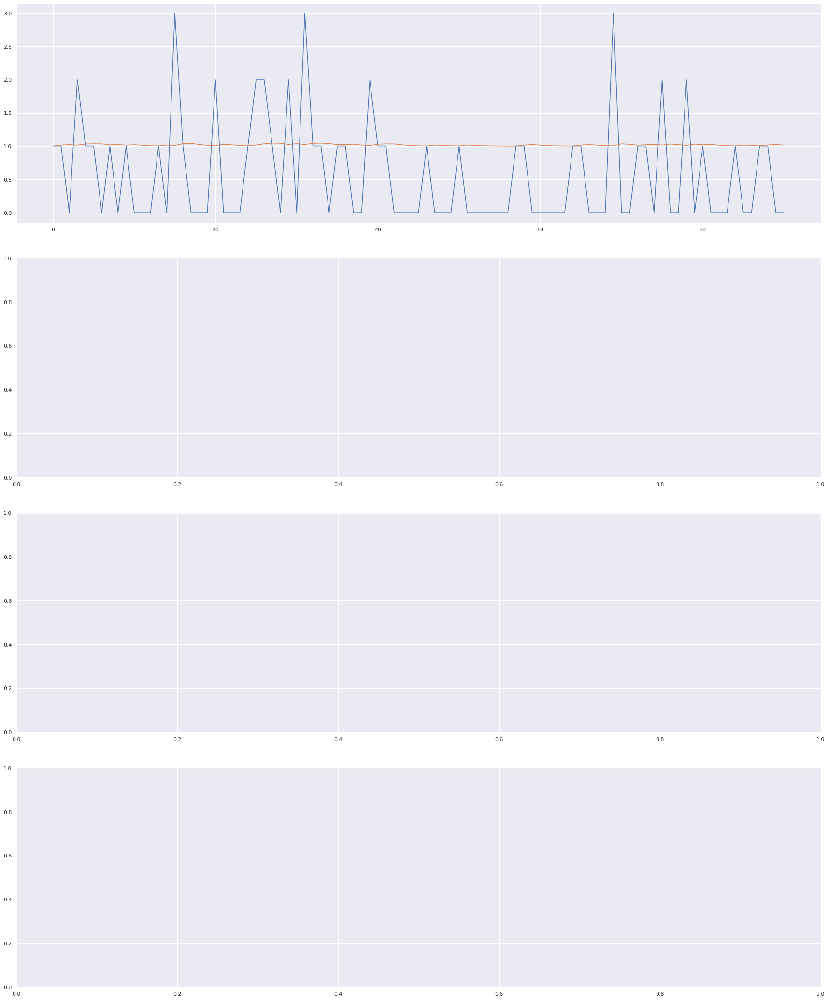

In [ ]:

lstm.eval()
train_predict = lstm(testX)

data_predict = train_predict.data.numpy()
dataY_plot = testY.data.numpy()

data_predict = sc.inverse_transform(data_predict)

dataY_plot = sc.inverse_transform(dataY_plot)

plt.axvline(x=train_size, c='r', linestyle='--')

#plt.plot(dataY_plot[:,1:2])
"""
plt.plot(dataY_plot[:,0:1])
plt.plot(data_predict[:,0:1])
plt.suptitle('Time-Series Prediction')
plt.show()
"""

#z=dataY_plot[:,0]-data_predict[:,0]




fig, axs = plt.subplots(4,1, figsize=(25,30))
fig.tight_layout(pad = 5)

for i in range(0,4):
    axs[(i)].plot(dataY_plot[:,i] )
    axs[(i)].plot(data_predict[:,i] )

plt.show()


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
#from sklearn.metrics import mean_absolute_percentage_error as mape

t = dataY_plot - data_predict


#k = mae(data_predict[:,3:4], dataY_plot[:,3:4])
k = mean_absolute_error(data_predict,dataY_plot)
z =  mean_squared_error(data_predict,dataY_plot)
print(k,z)


0.7382911 0.8064021


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

from math import sqrt

#r2_score(trainY,test['predicted'])
#mean_squared_error(trainY,test['predicted'])
#mean_absolute_error(test,prediciton)
for i in range(0,4):
    print(r2_score(dataY_plot[:,i],data_predict[:,i]), mean_absolute_error(dataY_plot[:,i],data_predict[:,i]),  mean_squared_error(dataY_plot[:,i],data_predict[:,i]),   sqrt(mean_squared_error(dataY_plot[:,i],data_predict[:,i])))

-0.30732487453785584 0.7382911 0.8064021 0.8979989349724247


IndexError: ignored

# ARIMA TEST

In [ ]:
#dados201907=v.loc[v.index<='2019-07-01']
#dados201907.sum(axis=0)
dados201907=df.loc[df.index<='2019-07-01']
dados201907.sum(axis=0)

TypeError: ignored

In [ ]:
training_dataX=df.iloc[:,[4]]
#training_dataX = df.loc[:,3]
# Create Training and Test
train_data_size = int(training_dataX.shape[0]*0.7)
trainX = training_dataX[:train_data_size]


test = training_dataX[train_data_size:]




#print(training_dataX)
test.shape


(385, 1)

In [ ]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

#df = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/wwwusage.csv', names=['value'], header=0)

model = pm.auto_arima(trainX, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=10, max_q=10, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      start_P=1, 
                      D=None, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

#dar uma olhada no intercept do arima

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=3334.375, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3426.526, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3386.902, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3395.579, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4277.176, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=3331.146, Time=1.37 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3374.669, Time=0.26 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=3334.859, Time=1.97 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3332.599, Time=1.52 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3331.430, Time=1.48 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=3372.946, Time=0.31 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=3332.676, Time=2.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3335.421, Time=0.31 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 10.816 seconds
                     

In [ ]:
!pip install -U statsmodels

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from statsmodels.tsa.arima.model import ARIMA 

#model = ARIMA(Xtr, order=(4,0,0), seasonal_order=(2, 0, 0, 52))
model = ARIMA(v[0], order=(3,0,6), seasonal_order=(0, 0, 0, 7))
model_fit = model.fit()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


In [ ]:
test

,0
898,0
899,1
900,2
901,0
902,0
...,...
1278,1
1279,5
1280,5
1281,3


In [ ]:
y_ARIMA = model_fit.forecast(test.shape[0])

In [ ]:
import numpy as np

test_ = test.fillna(0)

test_n=test_.to_numpy()
y_arima_n = y_ARIMA.to_numpy()
y_res = test_n - y_arima_n

print(y_res)
#print(test)
#print(y_res)
MAE = np.abs(y_res).mean()
MAPE = np.abs(y_res/(test_n + 0.00000001)).mean()*100
print(MAE)
print(MAPE)

[-3.21544821 -3.58411481 -4.60727998 -1.76438462 -3.77981849 -1.74576783
 -3.86519099 -0.84498167  0.13887363 -2.94529382 -0.91987107 -3.96471225
 -1.01443847 -4.00045462 -5.0544533  -5.07930888 -1.08170644 -3.13181126
 -5.14323608 -4.15957631 -4.19974434 -4.20697757 -4.23172652 -3.26123527
 -3.26983121 -3.29742866 -4.31852142 -1.33061112 -4.35705697 -3.37290141
 -5.38828062 -3.4115154  -1.42489305 -1.44223238 -3.46179067 -3.47452824
 -5.49230894 -4.50869501 -2.52163659 -4.53868405 -2.55277876 -2.56604433
 -3.58170575 -4.59435487 -3.60767427 -0.62176357 -2.63357452 -2.64656727
 -3.65920557 -3.67050822 -4.68285739 -4.69430421 -5.70520718 -4.71673034
 -4.72725722 -2.73773767 -4.74838509 -4.75820629 -4.76819208 -2.77800798
 -2.78726001 -5.79668495 -5.80576061 -5.81451263 -4.82334262 -3.83177842
 -4.84005571 -5.84829253 -1.85617519 -2.86398284 -3.87165552 -4.87904961
 -5.88638973 -3.8935419  -3.90049103 -4.90737192 -5.91405068 -3.92058349
 -4.92702209 -4.9332708  -4.93940762 -2.94542788 -4

In [ ]:
test.size

385

In [ ]:
prediciton = pd.DataFrame(model.predict(n_periods = int(test.size)),index=test.index[:test.size])
prediciton.columns = ['predicted']
prediciton

,predicted
898,1.260902
899,1.371779
900,1.388466
901,1.397352
902,1.405506
...,...
1278,2.044751
1279,2.044824
1280,2.044897
1281,2.044969


# Testing the regression

In [ ]:
!pip install scikit-learn==0.24

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.3 MB 7.2 MB/s 
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.0.2
    Uninstalling scikit-learn-1.0.2:
      Successfully uninstalled scikit-learn-1.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.4 requires scikit-learn>=1.0.0, but you have scikit-learn 0.24.0 which is incompatible.


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

from math import sqrt

#r2_score(trainY,test['predicted'])
#mean_squared_error(trainY,test['predicted'])
mean_absolute_error(test,prediciton)

print(r2_score(test,prediciton), mean_absolute_error(test,prediciton),  mean_squared_error(test,prediciton),   sqrt(mean_squared_error(test,prediciton)))

-0.1946403042668592 1.32588474985139 2.3630384170633665 1.5372177519998156


In [ ]:
print(test[0:7],prediciton)

Date
2018-10-01    7
2018-10-02    4
2018-10-03    8
2018-10-04    8
2018-10-05    5
2018-10-06    5
2018-10-07    7
Name: 0, dtype: int64             predicted
Date                 
2018-10-01   5.114500
2018-10-02   5.152931
2018-10-03   5.190187
2018-10-04   5.226307
2018-10-05   5.261323
2018-10-06   5.295271
2018-10-07   5.328182


In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

size = int(len(training_dataX) * 0.66)
train, test = training_dataX[0:size], training_dataX[size:len(training_dataX)]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(1,0,1))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	#print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()


Test RMSE: 3.194


# **Machine Learning Approachs**

(533,)

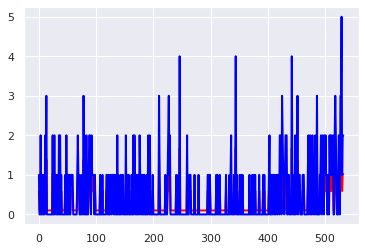

In [ ]:
from sklearn.metrics import mean_squared_error

from sklearn.svm import SVR
X=X.reshape((750,1))
Ytest = Ytest.reshape((533,1))
svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.002)
model = svr_rbf.fit(X,Y.ravel())
model.get_params()
trainPredict = model.predict(Ytest)

plt.plot(trainPredict,linewidth=2,color='red')
plt.plot(Ytest,linewidth=2,color='blue')
#plt.show()
trainPredict.shape

# **TSAI regression**